# Confident Object Detection via Conformal Prediction and Conformal Risk Control: an Application to Railway Signaling

In [1]:
%matplotlib inline
import torch
from confvision.data import TrotterDataset
from confvision.models import DiffusionDet, DETR, YOLOv5
from confvision.conformalizer import RiskConformalizer, Conformalizer

In [2]:
model = DiffusionDet()

In [3]:
cal_preds, test_preds = model.load_predictions()

Loading predictions from file
Total number of ground truths: 1974
Total number of predictions: 231459


In [4]:
conf_box_add_1c = Conformalizer(mode="box", method="additive", coordinate_wise=False)
conf_box_add_1c.calibrate(cal_preds, objectness_threshold=0.3, iou_threshold=0.3, alpha=0.1)
conf_box_add_1c.conformalize(test_preds);
cal_preds.describe(objectness_threshold=0.3, iou_threshold=0.3)
test_preds.describe(objectness_threshold=0.3, iou_threshold=0.3)

Calibrating with alpha=0.1


100%|█████████████████████████████████████| 1914/1914 [00:00<00:00, 3535.63it/s]


Obtained margin = [4.59197998046875, 4.59197998046875, 4.59197998046875, 4.59197998046875]
Coverage of predictions = 0.25 and of conformalized predictions = 0.94
Temporary removing strethc
Coverage of predictions = 0.21 and of conformalized predictions = 0.92
Temporary removing strethc


In [5]:
conf_box_add_4c = Conformalizer(mode="box", method="additive", coordinate_wise=True)
conf_box_add_4c.calibrate(cal_preds, objectness_threshold=0.3, iou_threshold=0.3, alpha=0.1)
conf_box_add_4c.conformalize(test_preds);
cal_preds.describe(objectness_threshold=0.3, iou_threshold=0.3);
test_preds.describe(objectness_threshold=0.3, iou_threshold=0.3);

Calibrating with alpha=0.1


100%|█████████████████████████████████████| 1914/1914 [00:00<00:00, 3820.59it/s]


Obtained margin = [3.3736114501953125, 9.7308349609375, 11.6104736328125, 5.64532470703125]
Coverage of predictions = 0.25 and of conformalized predictions = 0.96
Temporary removing strethc
Coverage of predictions = 0.21 and of conformalized predictions = 0.96
Temporary removing strethc


In [6]:
add_crc = RiskConformalizer(loss="recall", method="additive")
add_crc.calibrate(cal_preds, objectness_threshold=0.5, alpha=0.1)
add_crc.conformalize(test_preds);

[999.76, 1000.00] -> 999.88. Corrected Risk = 0.18: 100%|█| 13/13 [00:02<00:00, 


In [7]:
test_preds.describe(mode="risk", loss="recall", objectness_threshold=0.3,)

Average risk of predictions = 0.17 and of conformalized predictions = 0.01
Temporary removing strethc


In [15]:
add_crc = RiskConformalizer(loss="recall", method="multiplicative")
add_crc.calibrate(cal_preds, objectness_threshold=0.3, alpha=0.1)
add_crc.conformalize(test_preds);

[0.24, 0.49] -> 0.37. Corrected Risk = 0.10: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:03<00:00,  3.40it/s]


In [9]:
test_preds.describe(mode="risk", loss="recall", objectness_threshold=0.3,)

Average risk of predictions = 0.17 and of conformalized predictions = 0.09
Temporary removing strethc


In [10]:
add_crc = RiskConformalizer(loss="boxes", method="additive")
add_crc.calibrate(cal_preds, objectness_threshold=0.3, alpha=0.1)
add_crc.conformalize(test_preds);

[19.29, 19.53] -> 19.41. Corrected Risk = 0.10: 100%|█| 13/13 [00:03<00:00,  3.8


In [11]:
test_preds.describe(mode="risk", loss="boxes", objectness_threshold=0.3,)

Average risk of predictions = 0.55 and of conformalized predictions = 0.10
Temporary removing strethc


In [12]:
add_crc = RiskConformalizer(loss="degrancey", method="additive")
add_crc.calibrate(cal_preds, objectness_threshold=0.3, alpha=0.1)
add_crc.conformalize(test_preds);

[78.12, 78.37] -> 78.25. Corrected Risk = 0.10: 100%|█| 13/13 [00:03<00:00,  3.6


In [13]:
test_preds.describe(mode="risk", loss="degrancey", objectness_threshold=0.3,)

Average risk of predictions = 0.57 and of conformalized predictions = 0.10
Temporary removing strethc


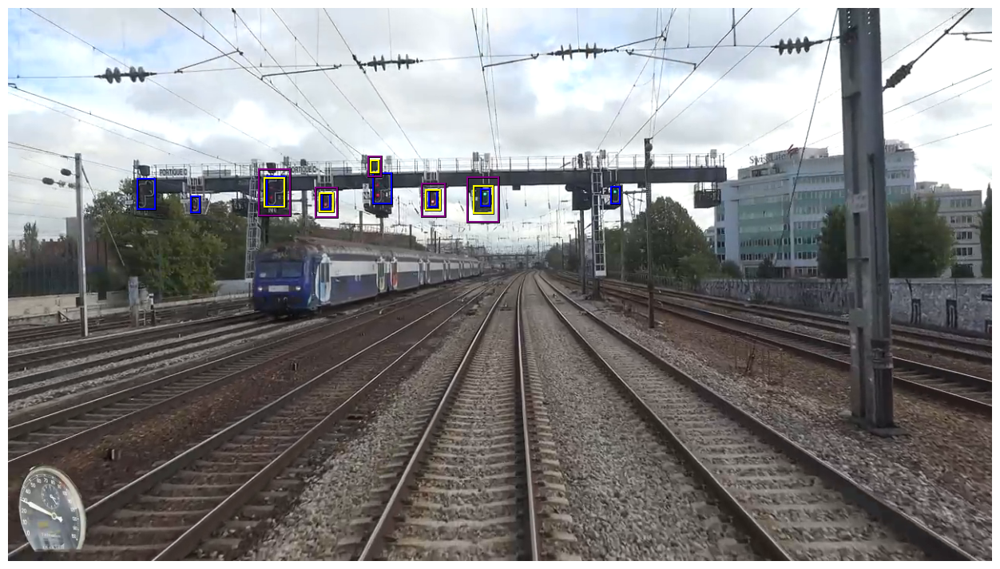

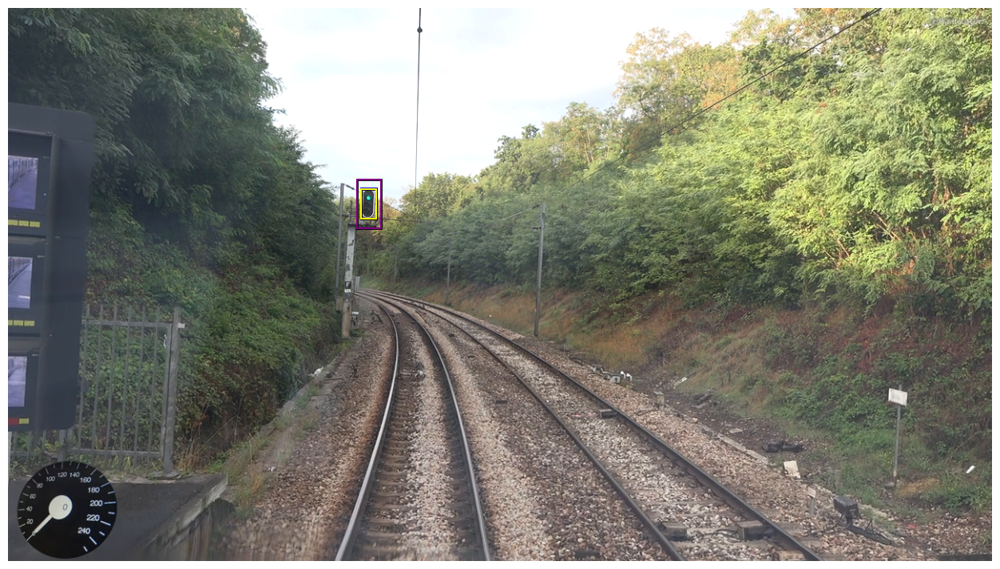

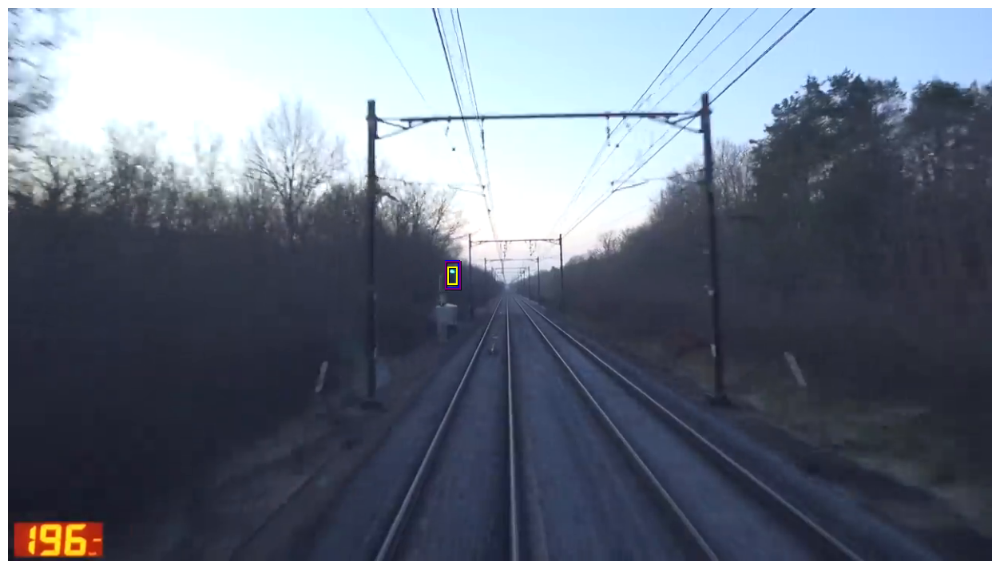

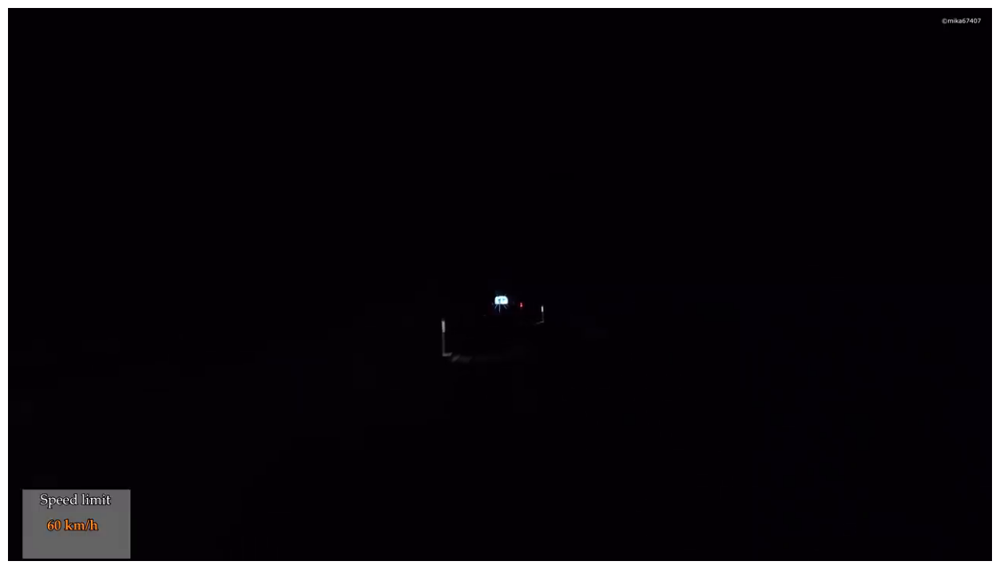

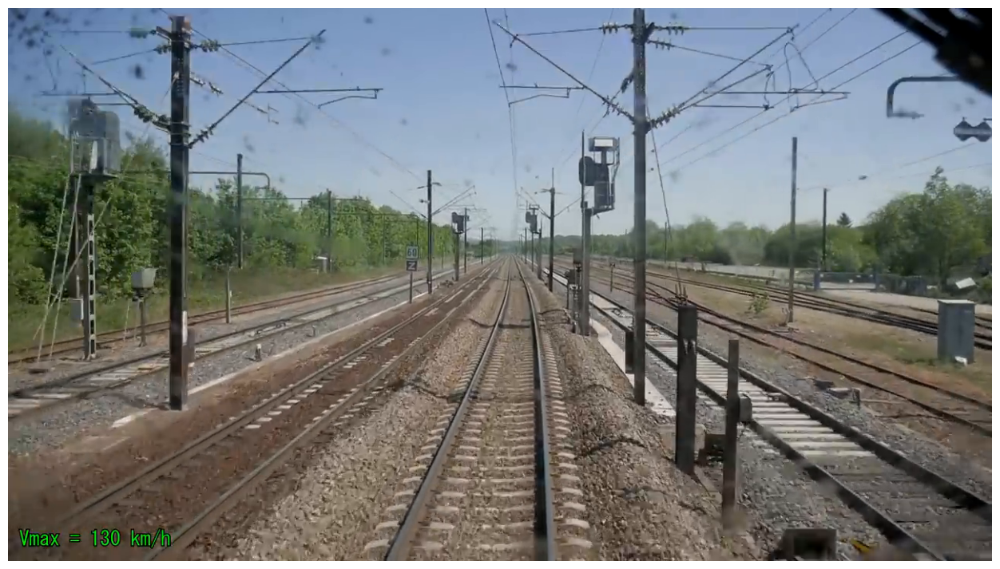

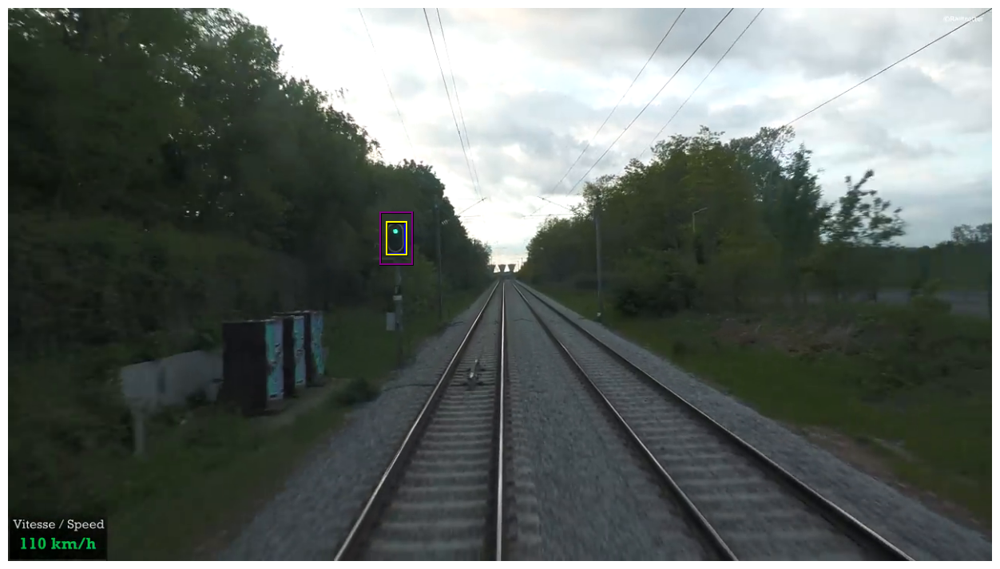

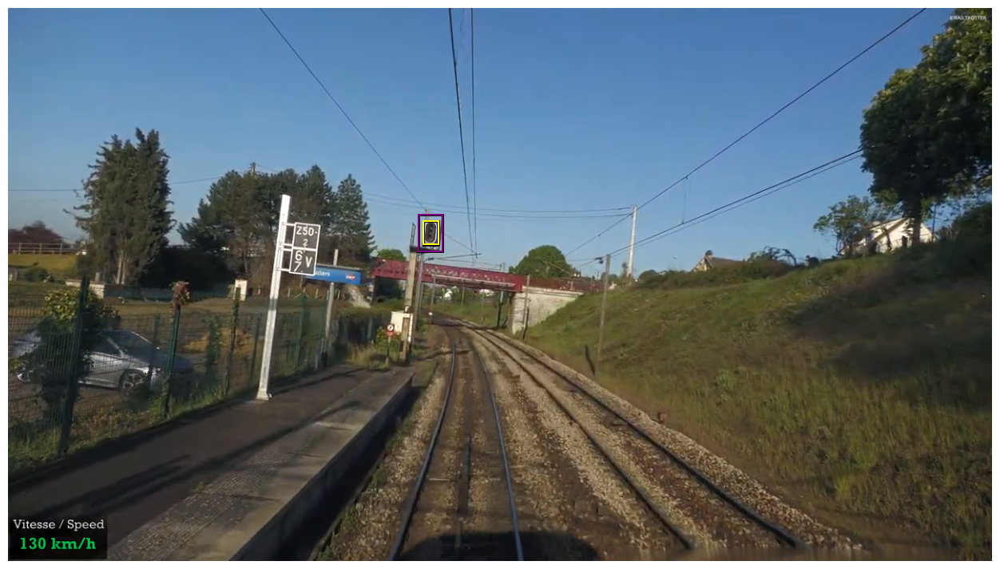

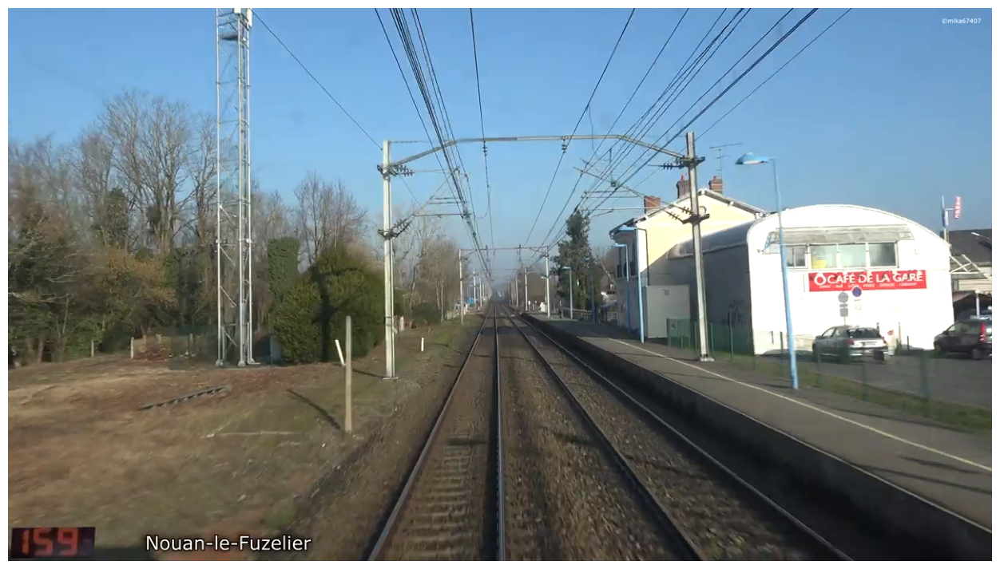

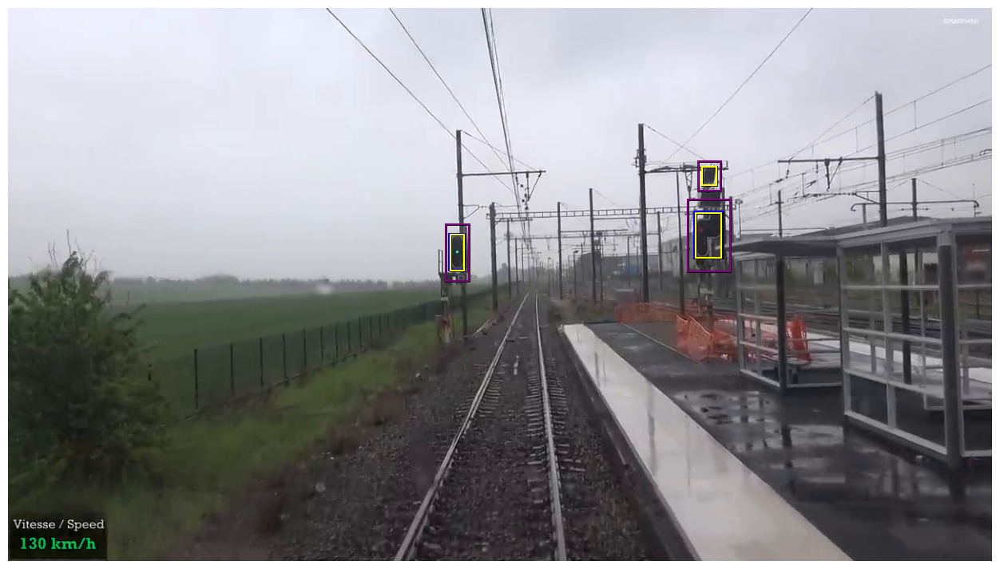

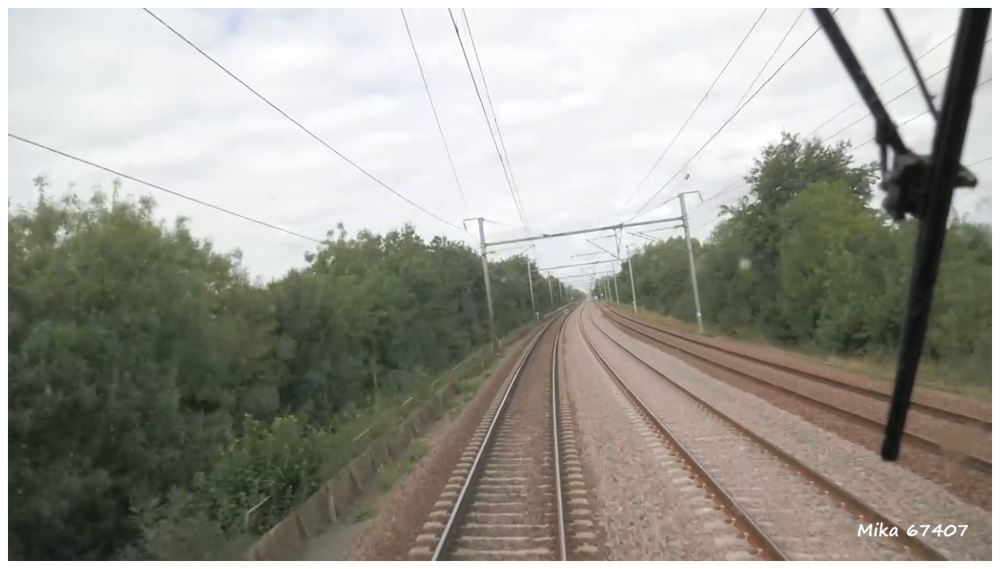

In [16]:
for i in range(10):
    test_preds.plot_img(i, score_threshold=0.5)